In [203]:
import numpy as np

import pandas as pd

import networkx as nx
from networkx.algorithms import bipartite

import matplotlib.pyplot as plt
from matplotlib import cm

import collections
from collections import Counter

from pylab import *

import community as community_louvain

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

import warnings
warnings.filterwarnings('ignore')

import json

%matplotlib inline


In [2]:
df_users = pd.read_csv('u.user',sep='|', header=None, names=['user_id','age','gender','occupation','zip_code'])
df_movies = pd.read_csv('u.item',sep='|',encoding='latin-1',header=None, names=['movie_id','movie_title','release_date','video_release_date','IMDb URL','unknown','action','adventure','animation','children\'s','comedy','crime','documentary','drama','fantasy','film-noir','horror','musical','mystery','romance','sci-fi','thriller','war','western'])
df_data = pd.read_csv('u.data',sep='\t',header=None,names=['user_id','movie_id','rating','timestamp'])

df = pd.merge(df_data, df_movies)
df =  pd.merge(df, df_users)

del df_users
del df_movies
del df_data

In [3]:
def create_graph(df):
    
    edges = list(zip(df.user_id, df.movie_title, df.rating))
    items = np.unique(df.movie_title)
    users = np.unique(df.user_id)
    g = nx.Graph()
    g.add_nodes_from(items, bipartite=0)
    g.add_nodes_from(users, bipartite=1)
    g.add_weighted_edges_from(edges)
    user_nodes, movie_nodes = bipartite.sets(g)
#     movie_g = bipartite.projected_graph(g, user_nodes)
#     user_g = bipartite.projected_graph(g, movie_nodes)

    print('The graph is connected:',nx.is_connected(g))
    print('The graph is bipartite:',nx.is_bipartite(g))

    return g, users, items

g, users, items = create_graph(df)

The graph is connected: True
The graph is bipartite: True


In [4]:
def mae_weight(G,u,v,weight='weight'):
    w = 0
    intersection = set(G[u]) & set(G[v])
    
    for nbr in intersection:
        w += np.abs( G[u][nbr].get(weight, 1) - G[v][nbr].get(weight, 1) )
        
    N = len(intersection)
    if N>10:
        w /= N
    else:
        w = 10.
    return w

def rmse_weight(G,u,v,weight='weight'):
    w=0
    intersection = set(G[u]) & set(G[v])
    
    for nbr in intersection:
        w += ( G[u][nbr].get(weight, 1) - G[v][nbr].get(weight, 1) )**2
        
    N = len(intersection)
    if N>10:
        w = np.sqrt(w/N)
    else:
        w = 10.
    return w


def get_projections(G, users=users, items=items, weight_function=None): 
    user_g = bipartite.generic_weighted_projected_graph(g, users, weight_function=weight_function)
    item_g = bipartite.generic_weighted_projected_graph(g, items, weight_function=weight_function)
    return user_g, item_g

# user_g, movie_g = get_projections(g, weight_function=mae_weight)
#MAE weight
user_mae_g, item_mae_g = get_projections(g, weight_function=mae_weight)
#RMSE weight
user_rmse_g, item_rmse_g = get_projections(g, weight_function=rmse_weight)

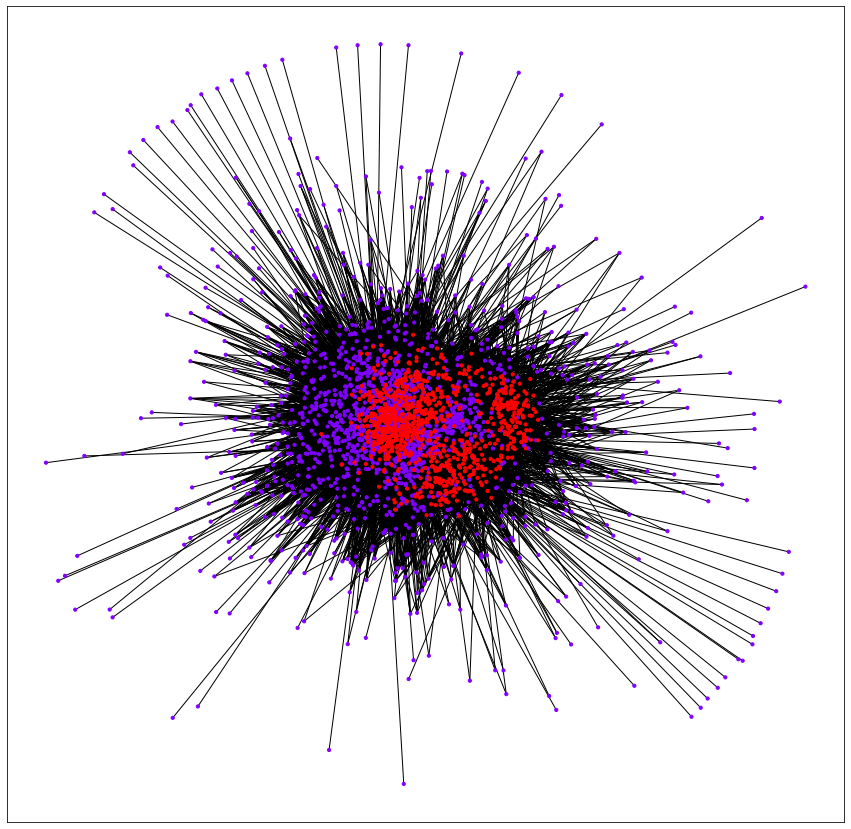

In [5]:
pos=nx.spring_layout(g)
plt.figure(figsize=(15,15))
nx.draw_networkx(g, pos=pos, arrows=True,
                 with_labels=False, node_size=10,
                 cmap = cm.rainbow,
                 node_color=[ 0 if i in items else 1 for i in g.nodes() ])

# MovieLens Dataset

MovieLens data sets were collected by the GroupLens Research Project
at the University of Minnesota.

This data set consists of:
* 100,000 ratings (1-5) from 943 users on 1682 movies. 
* Each user has rated at least 20 movies. 
* Simple demographic info for the users (age, gender, occupation, zip)

In [5]:
# pos = nx.spring_layout(g)  # positions for all nodes


def print_main_graph():

    fig, ax = plt.subplots(figsize=(15,15), facecolor=(1, 1, 1))
    ax.set_facecolor('xkcd:silver')
    pos = nx.spring_layout(g)

    nx.draw_networkx_nodes(g, pos, nodelist = users.tolist(), node_size=10, alpha=1, node_color='black', label='user') #draw nodes
    nx.draw_networkx_nodes(g, pos, nodelist = items.tolist(), node_size=10, alpha=1, node_color='green', label='item') #draw nodes
    # e5 = [(u,v)  for u,v,d in g.edges(data=True) if d['weight']>3]

    # e1 = [(u,v)  for u,v,d in g.edges(data=True) if d['weight']<3]

    # nx.draw_networkx_edges(g, pos, edgelist=e5, alpha=0.1, edge_color='b', label='positive rating')
    # nx.draw_networkx_edges(g, pos, edgelist=e1, alpha=0.1, edge_color='r', label='negative rating')

    nx.draw_networkx_edges(g, pos, edgelist=g.edges(), alpha=0.3, edge_color=[-d['weight'] for u,v,d in g.edges(data=True)], label='Ratings', edge_cmap=plt.cm.seismic, edge_vmin=-5, edge_vmax=-1)

    plt.legend()
    plt.show()

    print('\n\n\n\n\n\n\n\n\n')
    
    return

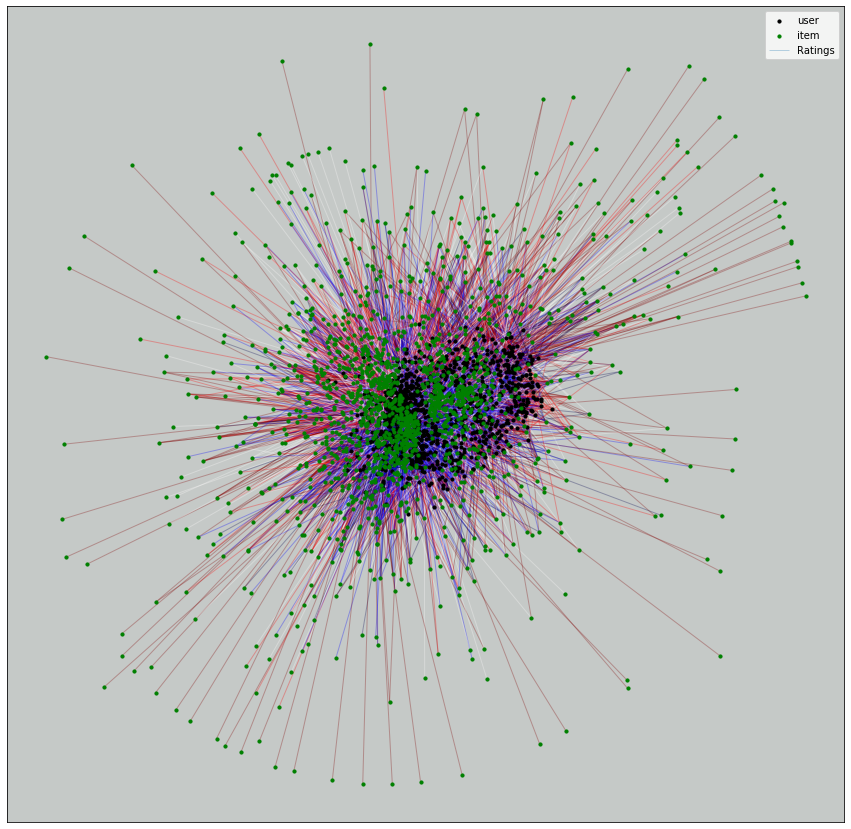

In [6]:
print_main_graph()

In [16]:
graphs = [g, item_mae_g, user_rmse_g]
graph_name = ['Full dataset', 'Movie Projection', 'User Projection']
edges = [len(graph.edges) for graph in graphs]
nodes = [len(graph.nodes) for graph in graphs]
maxi = [1664*943, 1664*1663/2, 943*942/2]
maxi = [int(m) for m in maxi]
perc_max = [n/m*100 for n,m in zip(edges,maxi)]

node_edges = pd.DataFrame({'Projection': graph_name, '# Nodes': nodes, '# Edges': edges, 'Max # Edges':maxi, '% Edges over Max':perc_max}).set_index('Projection')

## The data

Initially we created projections using

In [ ]:
user_g = bipartite.projected_graph(g, users)
item_g = bipartite.projected_graph(g, items)

In [18]:
node_edges

,# Nodes,# Edges,Max # Edges,% Edges over Max
Projection,,,,
Full dataset,2607,99693,1569152,6.353304
Movie Projection,1664,969440,1383616,70.065683
User Projection,943,429193,444153,96.631791


### What are good ways of projecting the data making the edges relevant?

Using a custom weight function

In [ ]:
user_g = bipartite.generic_weighted_projected_graph(g, users, weight_function=weight_function)
item_g = bipartite.generic_weighted_projected_graph(g, items, weight_function=weight_function)

## Custom weight function

We have used two metrics to calculate the weight of an edge connecting two items or two users:

1. Root Mean Square (RMSE)

$$ \text{RMSE} = \sqrt{ \dfrac{\sum_{\mathcal{N}}(r_u - r_v)^2 }{|\mathcal{N}|}}  $$

2. Mean Absolute Error (MAE)

$$ \text{MAE} =  \dfrac{\sum_{\mathcal{N}}(r_u - r_v) }{|\mathcal{N}|}  $$


In both cases we have set that they must have at least 10 nodes in common

In [42]:
def print_single_weight_distribution(graph, method, projection, ax):
    weights = [d['weight'] for u,v,d in graph.edges(data=True) if d['weight']< 4.]
    ax.set_title('Edge '+method+'-based Weight Distribution in the '+projection+' Projection')
    ax.set_ylabel('Relative Frequency')
    ax.set_xlabel('Edge '+method+'-based Weight')
    ax.hist(weights, bins=100, density=True)
    return 
    
def print_all_weight_distributions():  
    fig,ax = plt.subplots(2,2, figsize=(15,15))
    print_single_weight_distribution(user_rmse_g, 'RMSE', 'User', ax[0,0])
    print_single_weight_distribution(user_mae_g, 'MAE', 'User', ax[1,0])
    print_single_weight_distribution(item_rmse_g, 'RMSE', 'Movie', ax[0,1])
    print_single_weight_distribution(item_mae_g, 'MAE', 'Movie', ax[1,1])
    plt.show()
    print('\n\n\n\n\n\n\n'*5)
    return 



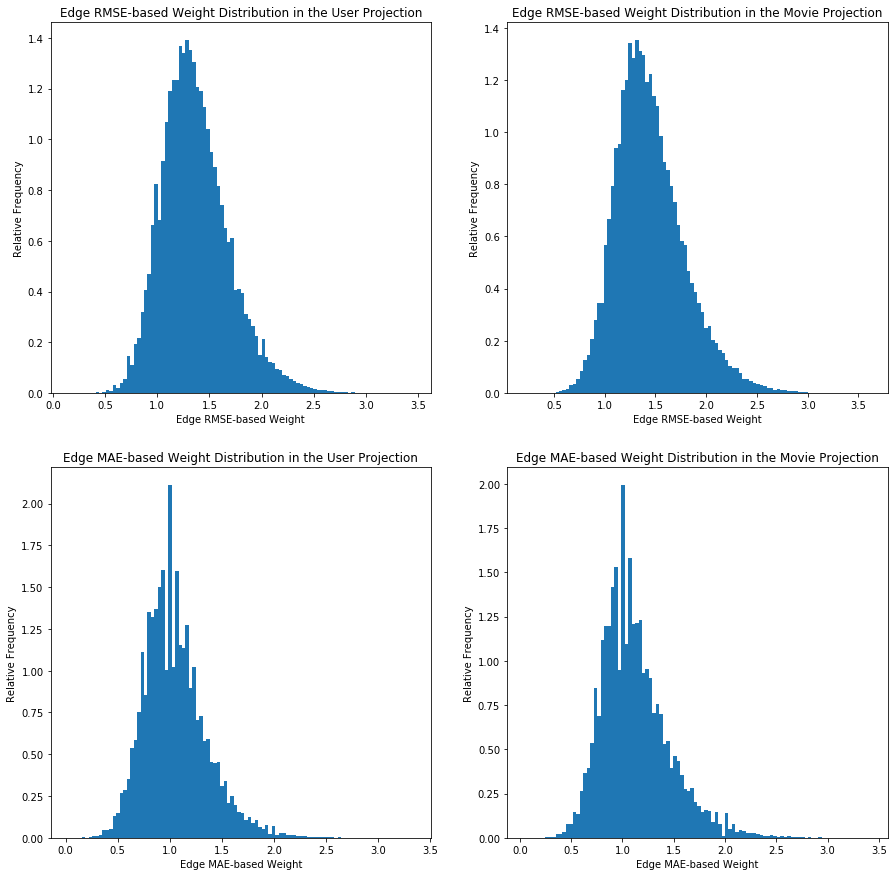

In [43]:
print_all_weight_distributions()

In [58]:
def graph_viz(graph, method='RMSE', max_weight=0.8, filename=False):

    fig,ax = plt.subplots(1,3, figsize=(17,5))
    
    weights = [d['weight'] for u,v,d in graph.edges(data=True) if d['weight']< 4.]
    ax[0].set_title('Edge Weight Distribution')
    ax[0].set_ylabel('Relative Frequency')
    ax[0].set_xlabel('Edge '+method+'-based Weight')
    ax[0].hist(weights, bins=100, density=True)
    ax[0].axvline(x=max_weight, color='red')
    

    new_g = nx.Graph()
    new_g.add_nodes_from(graph.nodes())
    new_g.add_weighted_edges_from( [(u,v,d['weight']) for u,v,d in graph.edges(data=True) if d['weight']< max_weight])
#     print('hello there', new_g.size(), new_g.order())
    new_g.remove_nodes_from([n for n,d in new_g.degree if d<2])
#     print('hello there', new_g.size(), new_g.order())
    degrees = [d for n,d in new_g.degree]
    node_sizes = np.array(degrees)/max(degrees)*100
    fraction_edges = new_g.size()/graph.size()*100
   
    
    a,b,_ = ax[1].hist(degrees, density=True, cumulative=False)
    ax[1].plot(b[:-1],a)
    ax[1].set_title('Degree Distribution with {:.2f}%'.format(fraction_edges))
    ax[1].set_xlabel('Node Degree')
    ax[1].set_ylabel('Relative Frequency')

    power_law_viz(graph=new_g, a_list=None, type_fit='cumulative', log_x=False, log_y=True, ax=ax[2], k=False)
    
    plt.show()

    
    plt.figure(figsize=(17,15))
    edges = [(u,v) for u,v,d in new_g.edges(data=True) if d['weight']< max_weight]
    weights =   [d['weight'] for u,v,d in new_g.edges(data=True) if d['weight']< max_weight]
    pos = nx.spring_layout(graph)
    nx.draw_networkx_nodes(new_g, pos, nodelist = None, node_size=node_sizes, alpha=1, node_color='black', label='user') #draw nodes
    ec = nx.draw_networkx_edges(new_g, pos, edgelist=edges, edge_color=weights, edge_cmap=plt.cm.winter, edge_vmin=0, edge_vmax=max_weight, alpha=1, width=1)
    plt.colorbar(ec)
    plt.legend()
#     print(len(weights), new_g.size())
    plt.show()
    
    if type(filename)==str:
        node_dict = []
        edge_dict = []
        for node,degree in new_g.degree:
            node_dict.append({
                'id' : node,
                'degree' : degree
            })
        for source,target,data in new_g.edges(data=True):
            edge_dict.append({
                'source' : source,
                'target' : target,
                'weight' : data['weight']
            })
        
        with open(filename+'.json','w') as file:
            json.dump({'nodes':node_dict, 'links':edge_dict}, file, indent=1)
    
    print('\n\n\n\n\n\n\n\n\n')
    
    return



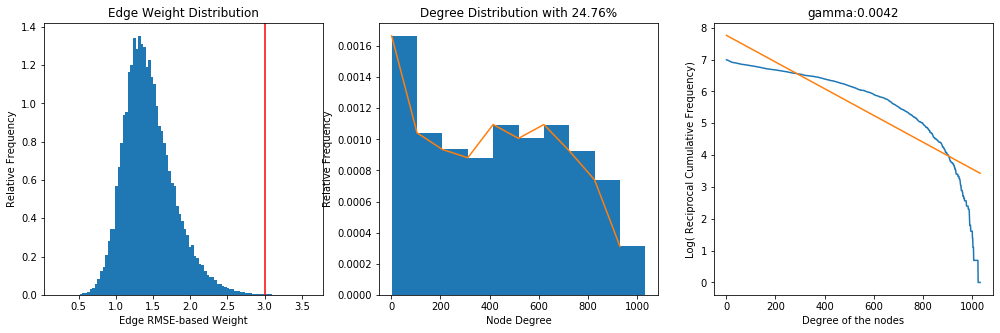

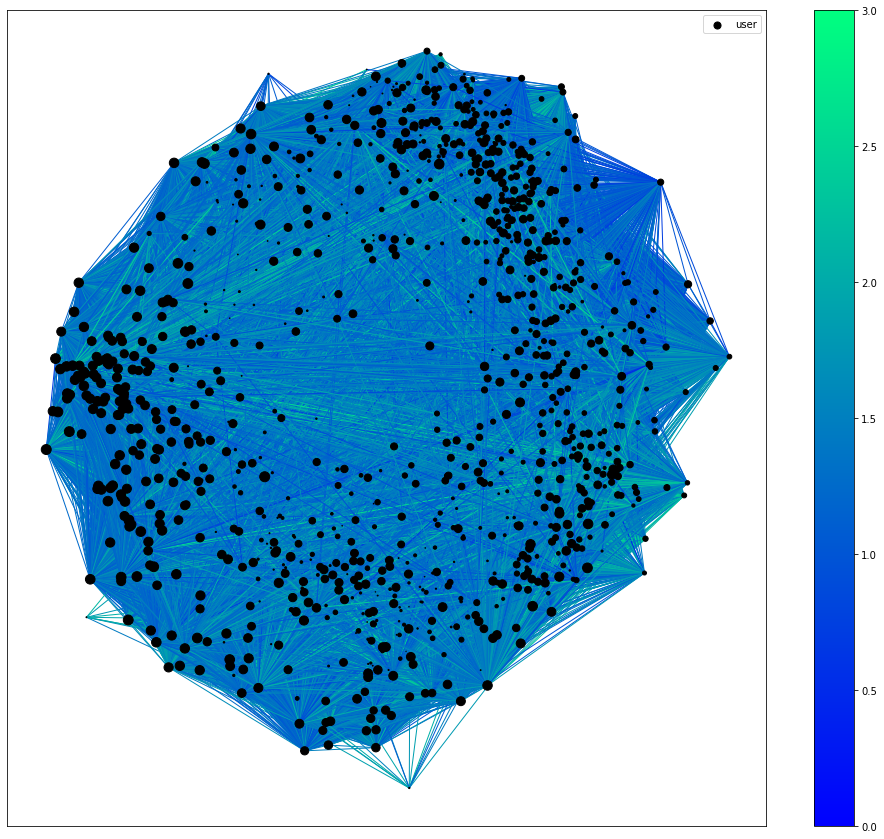

In [59]:
graph_viz(item_rmse_g, method='RMSE', max_weight=3)

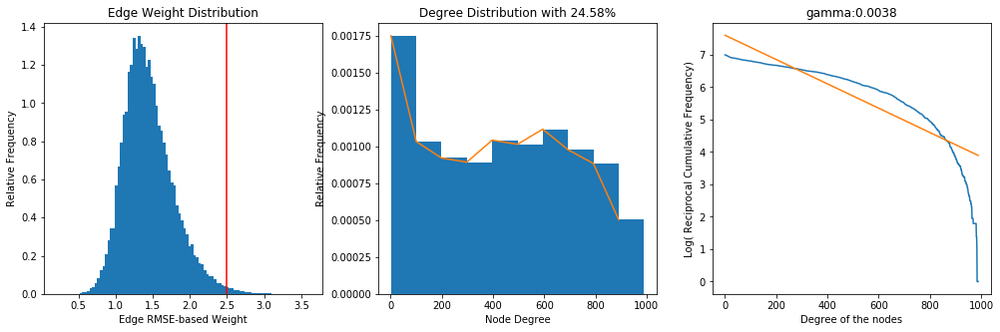

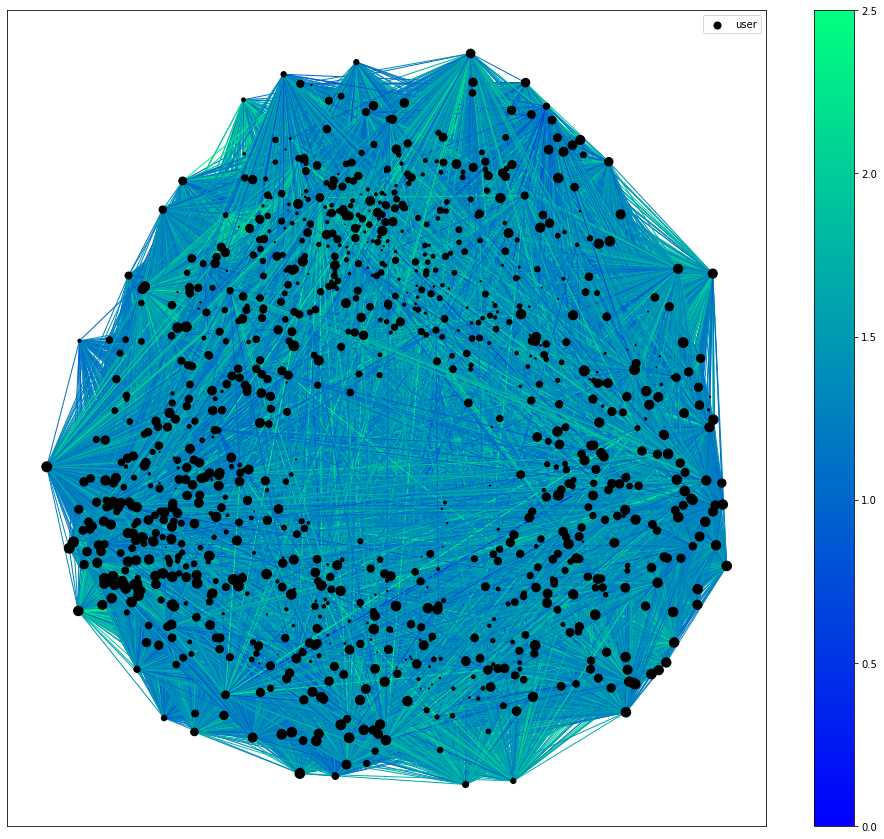

In [70]:
graph_viz(item_rmse_g, method='RMSE', max_weight=2.5)

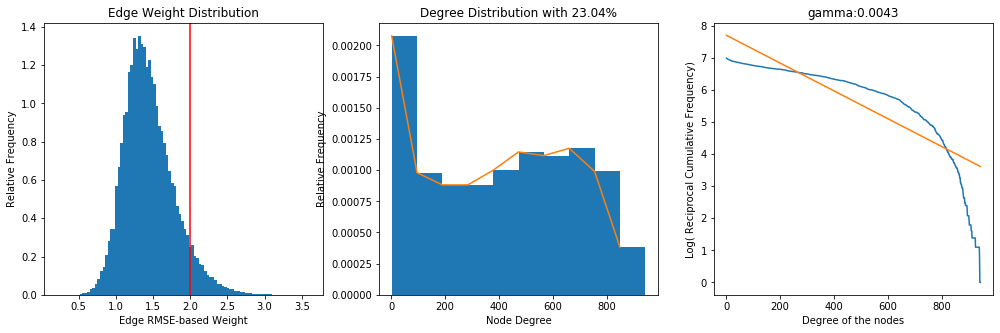

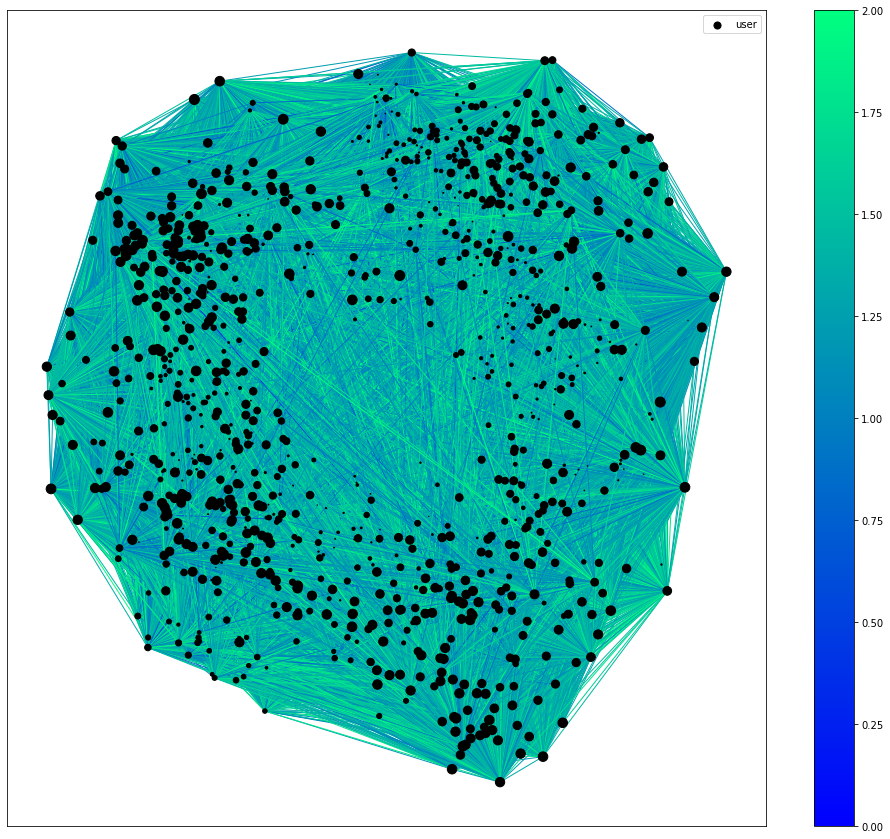

In [60]:
graph_viz(item_rmse_g, method='RMSE', max_weight=2)

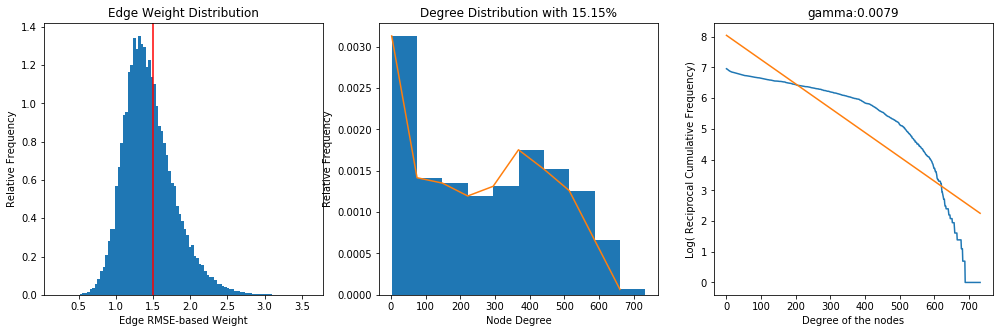

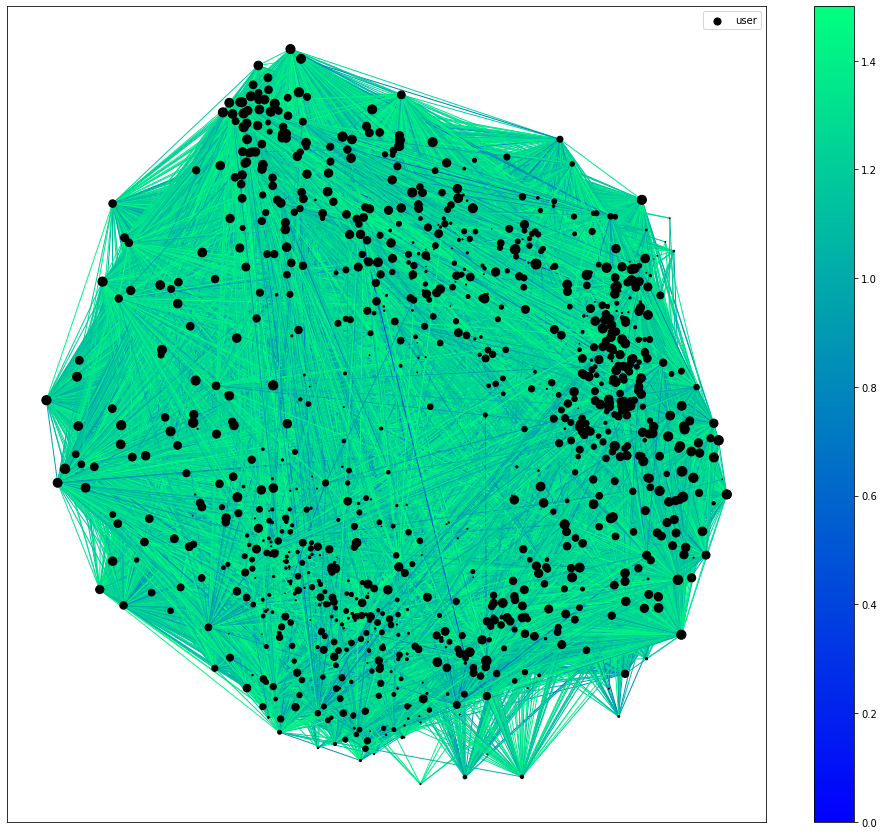

In [69]:
graph_viz(item_rmse_g, method='RMSE', max_weight=1.5)

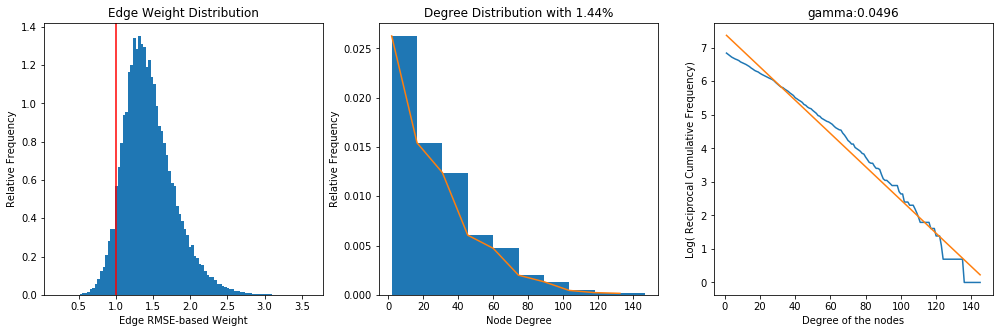

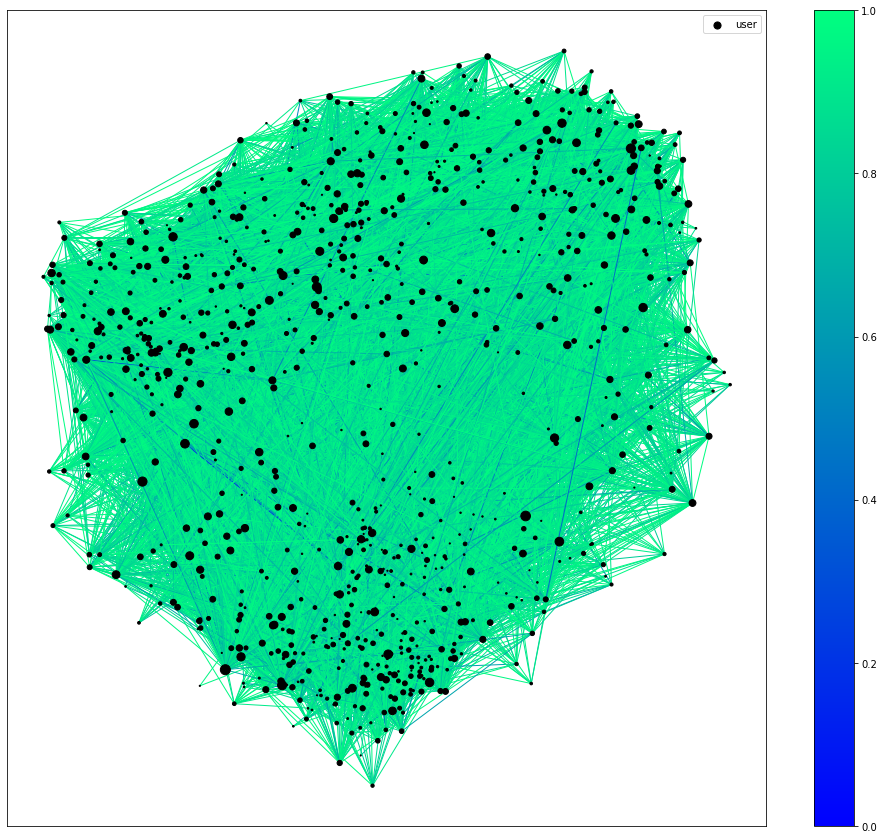

In [61]:
graph_viz(item_rmse_g, method='RMSE', max_weight=1)

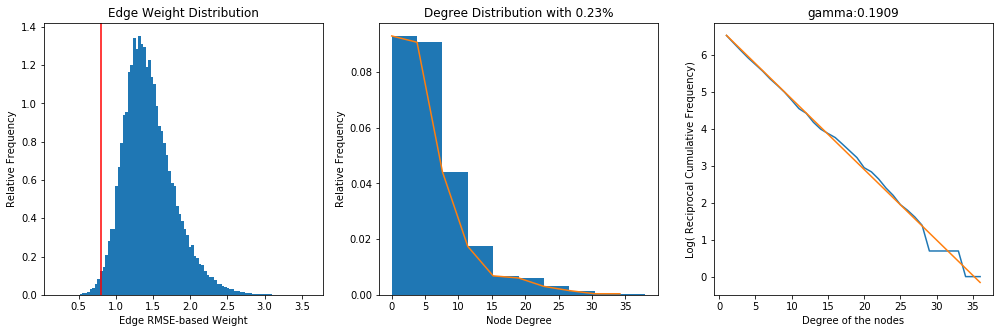

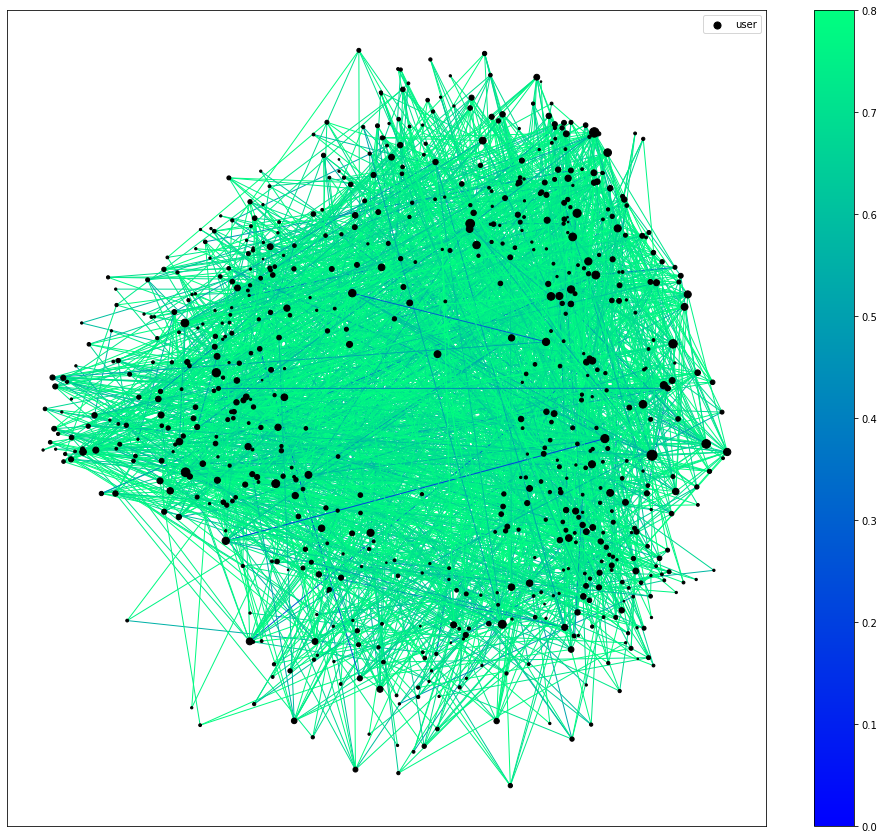

In [74]:
graph_viz(item_rmse_g, method='RMSE', max_weight=0.8, filename='rmse')

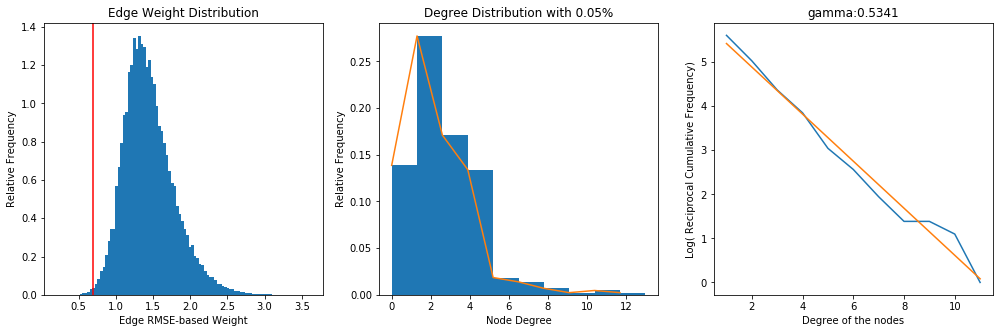

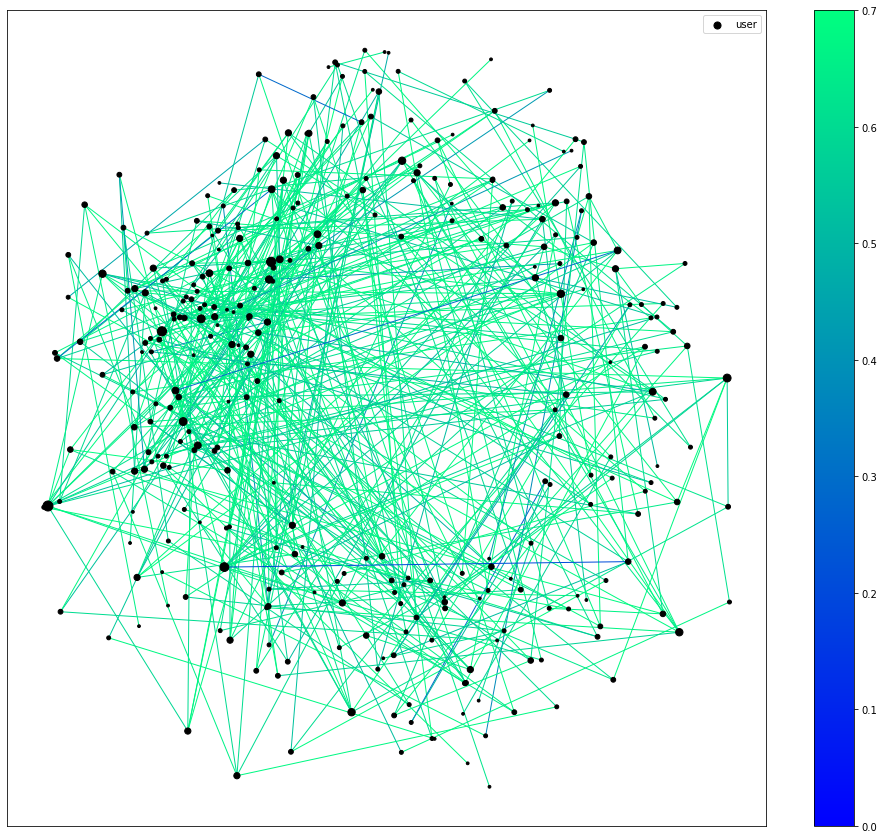

In [71]:
graph_viz(item_rmse_g, method='RMSE', max_weight=0.7)

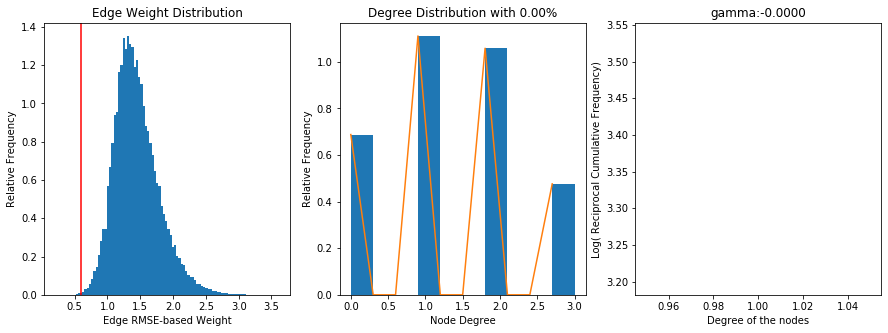

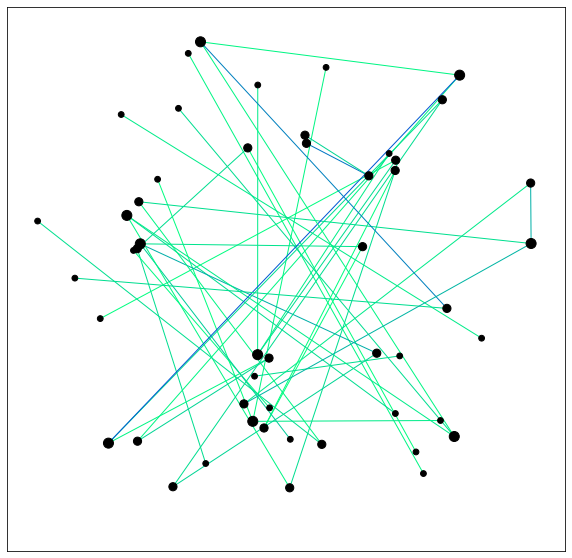

In [52]:
graph_viz(item_rmse_g, method='RMSE', max_weight=0.6)

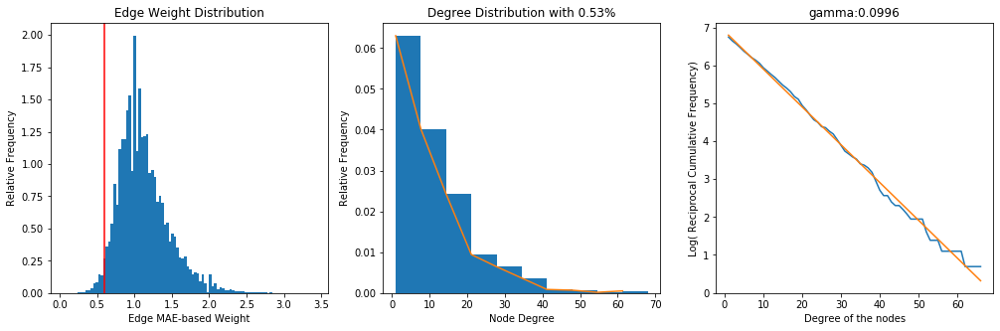

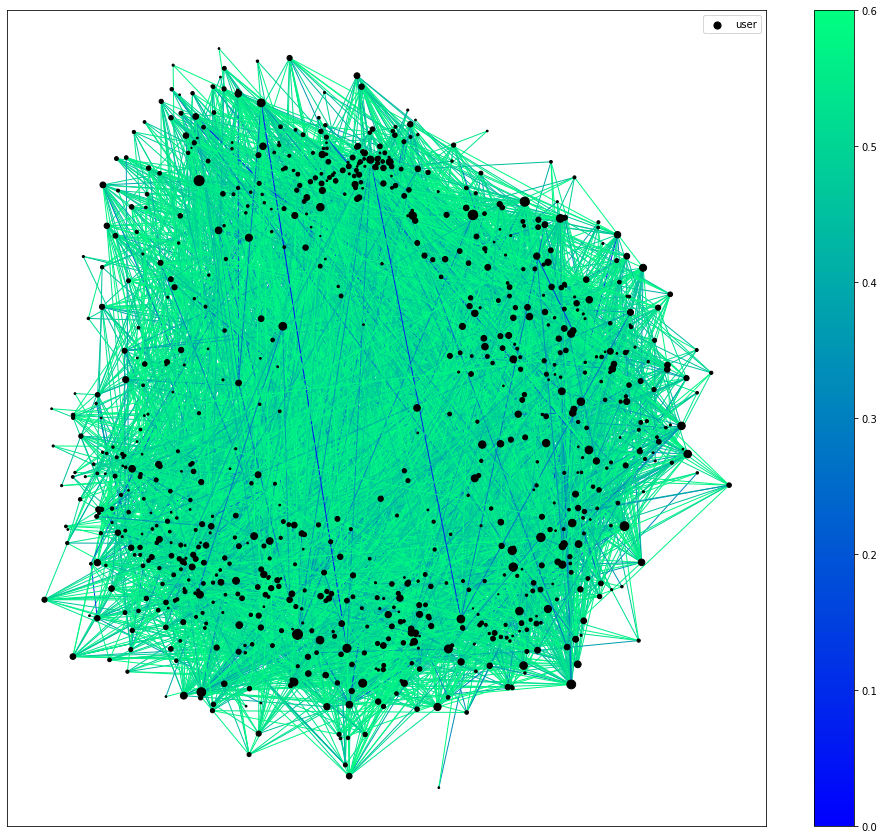

In [78]:
graph_viz(item_mae_g, method='MAE', max_weight=0.6, filename='mae')

In [73]:
viz_html(embed1)

In [81]:
from sklearn.linear_model import LinearRegression

# functions

def power_law(graph=None, a_list=None, type_fit='raw', log_x=False, log_y=False, k=False):
    
    if graph!=None:
        seq = [d for n,d in graph.degree()]
        print('graph found')
    elif type(a_list)!=None :
        print('list found')
        seq = a_list

    else:
        print('no input')
        return None
    
    print('>>>',type_fit)
    if type_fit=='raw':
        nbins_list = [10,100,1000]
        for nbins in nbins_list:
            print('NBINS:',nbins)
            fig = plt.figure()
            a,b,c = plt.hist(seq, bins=nbins)
            plt.close(fig)

            x = b[:-1]
            mask = (a>0) & (x>0)
        #     x = np.log(x[mask])
            x = x[mask].reshape(-1,1)
            y = a[mask]
            if log_x:
                x = np.log(x)
            if log_y:
                y = np.log(y)
                
            reg = LinearRegression().fit(x, y)
            ypred = reg.predict(x)
            gamma = -reg.coef_[0]
            
            plt.xlabel('Degree')
            if log_x:
                plt.xlabel('Log(Degree)')
            plt.ylabel('Frequency')
            if log_y:
                plt.ylabel('Log(Frequency)')
            plt.title('Number of bins:{}  gamma parameter:{:.4f}'.format(nbins, gamma))

            plt.plot(x,y)
            plt.plot(x,ypred)
            plt.show() 


    if type_fit=='cumulative':
        fig = plt.figure()
        print(max(seq))
        bins = [i for i in range(max(seq)+1)]
        print(max(seq))
        a,b,c = plt.hist(seq,bins=bins)
        plt.close(fig)
        cumulative = cdf(a)

        x = b[:-1]
        y = max(cumulative)-cumulative
        mask = (y>0) & (x>0)
        x = x[mask].reshape(-1,1)
        y = y[mask]
        if log_x:
            x = np.log(x)
        if log_y:
            y = np.log(y)

        reg = LinearRegression()
        reg.fit(x,y)
        ypred = reg.predict(x)
        gamma =  -reg.coef_[0] 
        
        plt.title('gamma:{:.4f}'.format(gamma))
        plt.xlabel('Degree of the nodes')
        if log_x:
            plt.xlabel('Log(Degree of the nodes)')
        plt.ylabel('Reciprocal Cumulative Frequency')
        if log_y:
            plt.ylabel('Log( Reciprocal Cumulative Frequency)')
        plt.plot(x,y)
        plt.plot(x,ypred)
        plt.show()
    
    if type_fit=='bins':
    
        bins = [2**i for i in range(11)]
        fig = plt.figure()
        plt.title(' Degree distribution')
        plt.ylabel('Frequency')
        plt.xlabel('Degree')
        a,b,c = plt.hist(seq, bins=bins)
        plt.close(fig)
        

        mask = (a>0) & (b[:-1]>0)
        x = b[:-1]
        y = a[mask]
        x = x[mask].reshape(-1,1)
        if log_x:
            x = np.log(x)
        if log_y:
            y = np.log(y)
       

        reg = LinearRegression()
        if k:
            mask = x>100
            x = x[mask].reshape(-1,1)
            y = y[mask.reshape(-1)]
        reg.fit(x,y)
        ypred = reg.predict(x)
        gamma = - reg.coef_[0]
        
        plt.title('gamma:{:.4f}'.format(gamma))
        plt.xlabel('Degree of the nodes')
        if log_x:
                plt.xlabel('Log(Degree of the nodes)')
        plt.ylabel('Frequency') 
        if log_y:
            plt.ylabel('Log(Frequency)')
        
        plt.plot(x,y)
        plt.plot(x,ypred)
        plt.show()
        
    return gamma

def cdf(sth):
    for i in range(1,len(sth)):
        sth[i] += sth[i-1]
    return sth

In [44]:
from sklearn.linear_model import LinearRegression
def power_law_viz(graph=None, a_list=None, type_fit='raw', log_x=False, log_y=False, ax=None, k=False):
    
    if graph!=None:
        seq = [d for n,d in graph.degree()]
#         print('graph found')
    elif type(a_list)!=None :
#         print('list found')
        seq = a_list

    else:
        print('no input')
        return None
    
#     print('>>>',type_fit)
    if type_fit=='raw':
        nbins_list = [10,100,1000]
        for nbins in nbins_list:
            print('NBINS:',nbins)
            fig = plt.figure()
            a,b,c = plt.hist(seq, bins=nbins)
            plt.close(fig)

            x = b[:-1]
            mask = (a>0) & (x>0)
        #     x = np.log(x[mask])
            x = x[mask].reshape(-1,1)
            y = a[mask]
            if log_x:
                x = np.log(x)
            if log_y:
                y = np.log(y)
                
            reg = LinearRegression().fit(x, y)
            ypred = reg.predict(x)
            gamma = -reg.coef_[0]
            
            plt.xlabel('Degree')
            if log_x:
                plt.xlabel('Log(Degree)')
            plt.ylabel('Frequency')
            if log_y:
                plt.ylabel('Log(Frequency)')
            plt.title('Number of bins:{}  gamma parameter:{:.4f}'.format(nbins, gamma))

            plt.plot(x,y)
            plt.plot(x,ypred)
            plt.show() 


    if type_fit=='cumulative':
        fig = plt.figure()
#         print(max(seq))
        bins = [i for i in range(max(seq)+1)]
#         print(max(seq))
        a,b,c = plt.hist(seq,bins=bins)
        plt.close(fig)
        cumulative = cdf(a)

        x = b[:-1]
        y = max(cumulative)-cumulative
        mask = (y>0) & (x>0)
        x = x[mask].reshape(-1,1)
        y = y[mask]
        if log_x:
            x = np.log(x)
        if log_y:
            y = np.log(y)

        reg = LinearRegression()
        reg.fit(x,y)
        ypred = reg.predict(x)
        gamma =  -reg.coef_[0] 
        
        ax.set_title('gamma:{:.4f}'.format(gamma))
        ax.set_xlabel('Degree of the nodes')
        if log_x:
            ax.set_xlabel('Log(Degree of the nodes)')
        ax.set_ylabel('Reciprocal Cumulative Frequency')
        if log_y:
            ax.set_ylabel('Log( Reciprocal Cumulative Frequency)')
        ax.plot(x,y)
        ax.plot(x,ypred)
#         plt.show()
    
    if type_fit=='bins':
    
        bins = [2**i for i in range(11)]
        fig = plt.figure()
        plt.title(' Degree distribution')
        plt.ylabel('Frequency')
        plt.xlabel('Degree')
        a,b,c = plt.hist(seq, bins=bins)
        plt.close(fig)
        

        mask = (a>0) & (b[:-1]>0)
        x = b[:-1]
        y = a[mask]
        x = x[mask].reshape(-1,1)
        if log_x:
            x = np.log(x)
        if log_y:
            y = np.log(y)
       

        reg = LinearRegression()
        if k:
            mask = x>100
            x = x[mask].reshape(-1,1)
            y = y[mask.reshape(-1)]
        reg.fit(x,y)
        ypred = reg.predict(x)
        gamma = - reg.coef_[0]
        
        plt.title('gamma:{:.4f}'.format(gamma))
        plt.xlabel('Degree of the nodes')
        if log_x:
                plt.xlabel('Log(Degree of the nodes)')
        plt.ylabel('Frequency') 
        if log_y:
            plt.ylabel('Log(Frequency)')
        
        plt.plot(x,y)
        plt.plot(x,ypred)
        plt.show()
        
    return gamma


def cumulative_reg( seq=None, log_x=False, log_y=False, ax=None, nbins=100):
    
        fig = plt.figure()
#         print(max(seq))
#         bins = [i for i in range(max(seq)+1)]
#         print(max(seq))
        a,b,c = plt.hist(seq,bins=nbins)
        plt.close(fig)
        cumulative = cdf(a)

        x = b[:-1]
        y = max(cumulative)-cumulative
        mask = (y>0) & (x>0)
        x = x[mask].reshape(-1,1)
        y = y[mask]
        if log_x:
            x = np.log(x)
        if log_y:
            y = np.log(y)

        reg = LinearRegression()
        reg.fit(x,y)
        ypred = reg.predict(x)
        gamma =  -reg.coef_[0] 
        
        ax.set_title('gamma:{:.4f}'.format(gamma))
        ax.set_xlabel('Degree of the nodes')
        if log_x:
            ax.set_xlabel('Log(Degree of the nodes)')
        ax.set_ylabel('Reciprocal Cumulative Frequency')
        if log_y:
            ax.set_ylabel('Log( Reciprocal Cumulative Frequency)')
        ax.plot(x,y)
        ax.plot(x,ypred)
        
        
        
def cdf(sth):
    for i in range(1,len(sth)):
        sth[i] += sth[i-1]
    return sth

In [66]:
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import eigs

#bipartite pagerank
n = len(users)
m = len(items)
N = n + m
user_id_to_idx = dict(zip(users, range(n)))
item_id_to_idx = dict(zip(items, range(m)))

df['user_idx'] = df['user_id'].apply(lambda x: user_id_to_idx[x])
df['movie_idx'] = df['movie_title'].apply(lambda x: item_id_to_idx[x])

data = df['rating'].tolist()
cols = df['user_idx'].tolist()
rows = df['movie_idx'].tolist()
shape = (m,n)

print( len(data), len(cols), len(rows), n, m, n*m)
print( max(rows), max(cols))

W = csr_matrix( (data, (rows,cols)), shape=shape )

val1, user_eig = eigs((W.T@W).asfptype(), k=1, which='LR')
val2, item_eig = eigs((W@W.T).asfptype(), k=1, which='LR')
user_eig = user_eig.real.ravel()/user_eig.real.sum()
item_eig = item_eig.real.ravel()/item_eig.real.sum()

user_eig.sum()

100000 100000 100000 943 1664 1569152
1663 942


0.9999999999999999

# Partitions

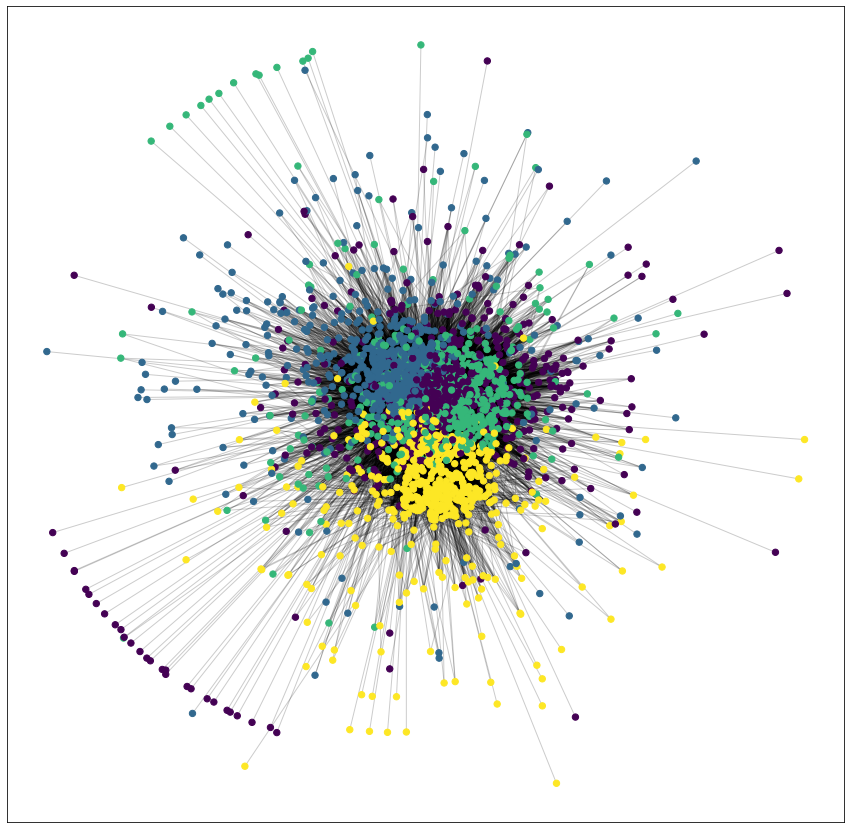

In [207]:
partition(g)

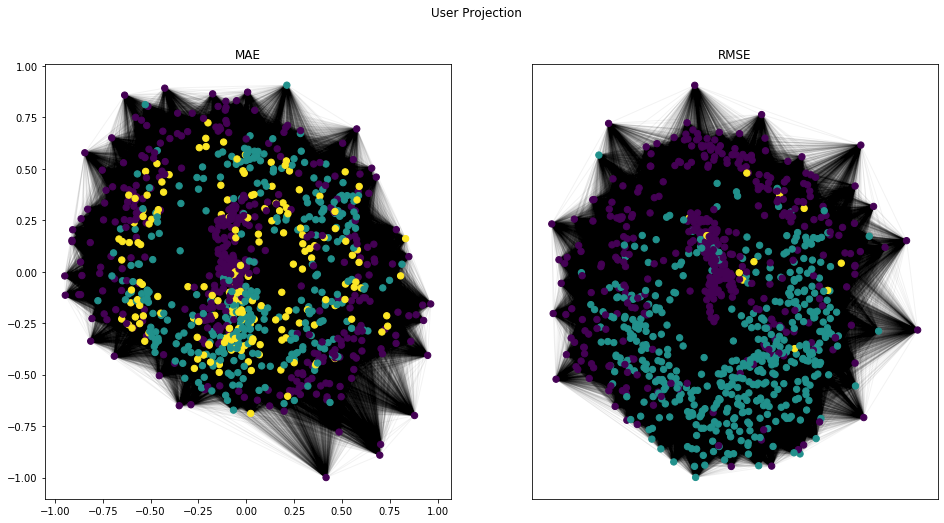

In [230]:
plot_partitions(projection='user')

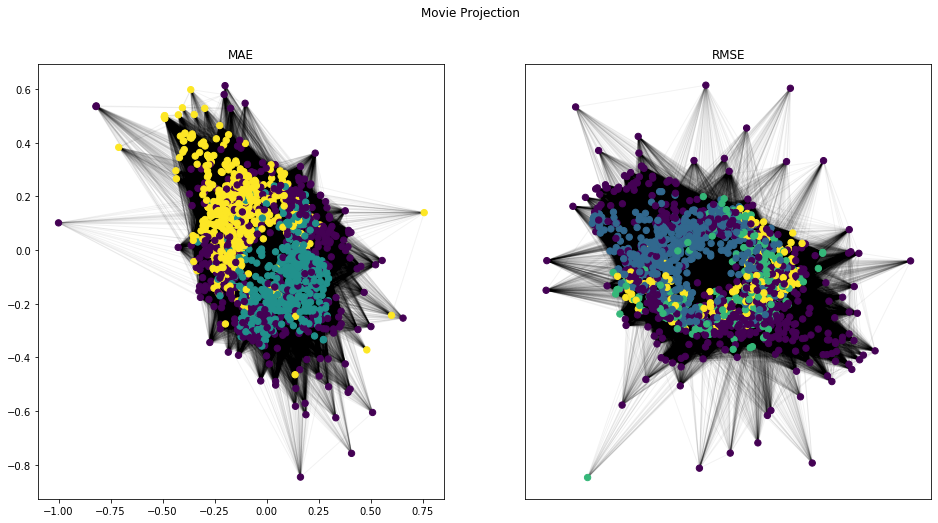

In [231]:
plot_partitions(projection='movie')

# Eigenvector centrality for a bipartite graph


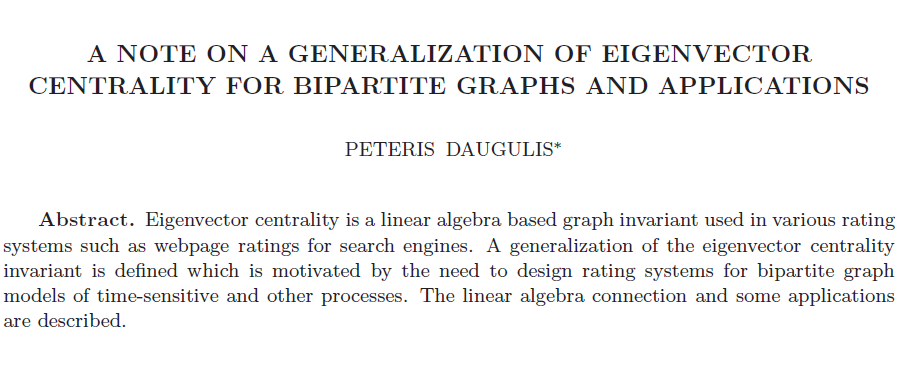



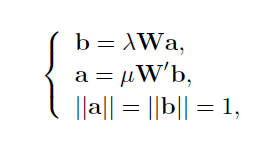



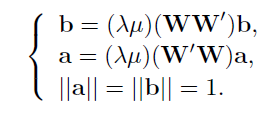

In [67]:
def print_eigenvector_centrality_viz():
    fig,ax = plt.subplots(2,2, figsize=(15,15))
    print(ax.shape)


    ax[0,0].set_title('User Bipartite Centrality Distribution')
    ax[0,0].set_xlabel('PageRank')
    ax[0,0].set_ylabel('Relative Frequency')
    ax[0,0].hist(user_eig, density=True)

    cumulative_reg( seq=user_eig, log_x=False, log_y=True, ax=ax[0,1], nbins=20)
    cumulative_reg( seq=item_eig, log_x=False, log_y=True, ax=ax[1,1], nbins=50)

    ax[1,0].set_title('Movie Bipartite Centrality Distribution')
    ax[1,0].set_xlabel('PageRank')
    ax[1,0].set_ylabel('Relative Frequency')
    ax[1,0].hist(item_eig, density=True)

    plt.show()
    
    print('\n\n\n\n\n\n\n\n\n')
    return None

(2, 2)


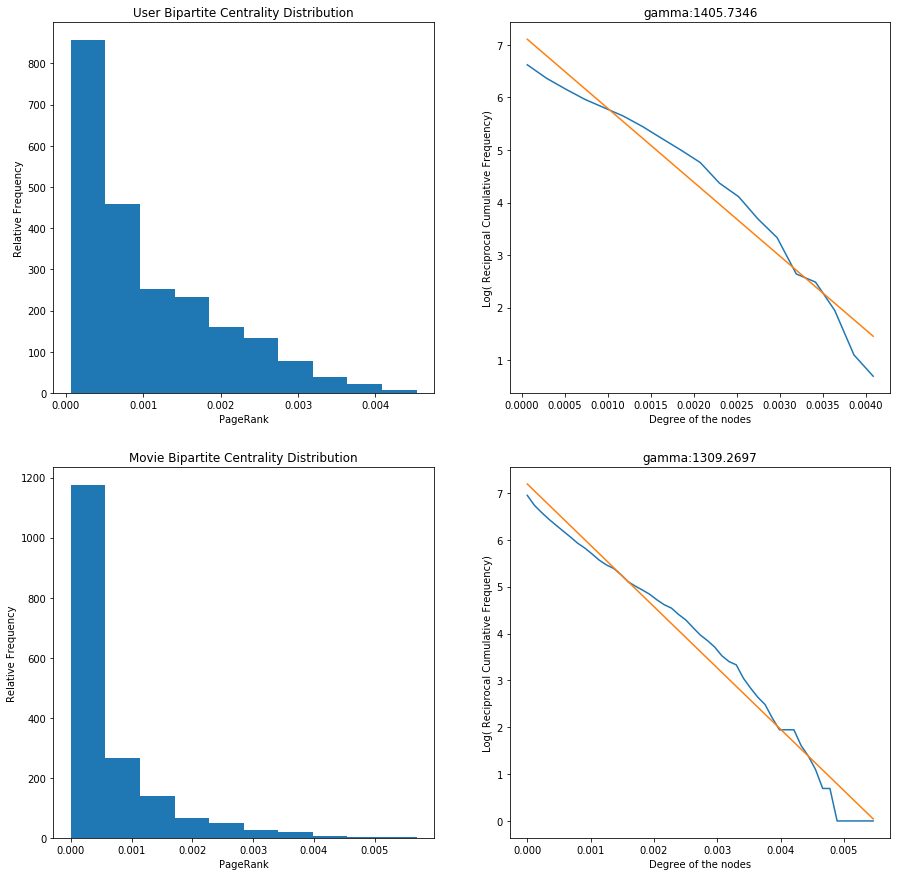

In [68]:
print_eigenvector_centrality_viz()

In [72]:
from IPython.display import display, HTML
embed1 = """
<div id="observablehq-ff8e437e"></div>
<script type="module">
import {Runtime, Inspector} from "https://cdn.jsdelivr.net/npm/@observablehq/runtime@4/dist/runtime.js";
import define from "https://api.observablehq.com/@alcome1614/movielens-dataset.js?v=3";
const inspect = Inspector.into("#observablehq-ff8e437e");
(new Runtime).module(define, name => (name === "interactive_network" || name === "viewof minimumDegree" || name === "viewof strengthValue" ||  name === "viewof nodesize" || name === "viewof collideStrenght" || name === "viewof maxedgewidth" || name === "viewof edgealpha") ? inspect() : undefined);
</script>
"""


def viz_html(embed):
    display(HTML(embed))
    print('\n\n\n\n\n\n\n')
    return None

In [201]:
def most_similar(item='Star Wars (1977)', method='rmse'):
    
    def order_list(list1, list2,topk=10):
        people = np.array(list1)
        ages = np.array(list2)
        inds = ages.argsort()
        sortedPeople = people[inds]
        return sortedPeople[:topk].tolist()
    
    if method=='rmse':
        #RMSE
        weights = np.array([d['weight'] for u,v,d in item_rmse_g.edges(item, data=True)])
        neighb = np.array([v for u,v in item_rmse_g.edges(item)])
    
    if method=='mae':
        #RMSE
        weights = np.array([d['weight'] for u,v,d in item_mae_g.edges(item, data=True)])
        neighb = np.array([v for u,v in item_mae_g.edges(item)])
        
    if method=='personalized':
        #personalized page rank
        gr = GraphRecommender()
        gr.fit(df)
        neighb, weights = gr.pagerank(item)
        weights= -weights

    return order_list(neighb, weights)

similar_df = pd.DataFrame({'RMSE': most_similar(item= 'Star Wars (1977)',method='rmse'), 'MAE':most_similar(item= 'Star Wars (1977)',method='mae'), 'Personalized PR': most_similar(item='Star Wars (1977)', method='personalized')})


# escribe lo que quieras acá pelotudo !!!!

flsjflsjflsdjf

## Using the different metrics to find most similar items

Let's take the original Star Wars movie:

In [202]:
similar_df

,RMSE,MAE,Personalized PR
0,"Empire Strikes Back, The (1980)","Empire Strikes Back, The (1980)",Raiders of the Lost Ark (1981)
1,Return of the Jedi (1983),Return of the Jedi (1983),Return of the Jedi (1983)
2,Some Folks Call It a Sling Blade (1993),Raiders of the Lost Ark (1981),Fargo (1996)
3,Raiders of the Lost Ark (1981),Primary Colors (1998),"Silence of the Lambs, The (1991)"
4,Primary Colors (1998),Some Folks Call It a Sling Blade (1993),"Empire Strikes Back, The (1980)"
5,Waiting for Guffman (1996),Wallace & Gromit: The Best of Aardman Animatio...,Pulp Fiction (1994)
6,Foreign Correspondent (1940),"Wrong Trousers, The (1993)","Godfather, The (1972)"
7,Meet John Doe (1941),"Close Shave, A (1995)",Toy Story (1995)
8,12 Angry Men (1957),When We Were Kings (1996),Back to the Future (1985)
9,"Close Shave, A (1995)",12 Angry Men (1957),"Fugitive, The (1993)"


In [196]:
import scipy
from scipy.sparse import csr_matrix 
import functools
import itertools
import operator
from sklearn.preprocessing import normalize
from scipy.sparse.linalg import eigs
from time import time


class GraphRecommender():
    def __init__(self):
        return None
    
    def fit(self, df):    
        self.df = df.copy()
        self.users = np.unique(self.df.user_id)
        self.items = np.unique(self.df.movie_title)
        self.n = len(self.users)
        self.m = len(self.items)
        self.N = self.n+self.m
        self.listN = list(range(self.N))
        self.user_id_to_idx = dict( zip( self.users, range(self.n) ) )
        self.user_idx_to_id = dict( zip( range(self.n), self.users ) )
        self.item_id_to_idx = dict( zip( self.items, range(self.n, self.N) ) )
        self.item_idx_to_id = dict( zip( range(self.n, self.N), self.items ) )
        self.df['user_idx'] = self.df['user_id'].apply(lambda x: self.user_id_to_idx[x])
        self.df['item_idx'] = self.df['movie_title'].apply(lambda x: self.item_id_to_idx[x])
        #creating ADJACENT MATRIX: A
        colrow = list(self.df.user_idx) + list(self.df.item_idx)
        rowcol = list(self.df.item_idx) + list(self.df.user_idx) 
        data = 2*list(self.df.rating)
        self.shape = (self.N, self.N)
        self.A = scipy.sparse.csr_matrix( (data, (colrow, rowcol)), self.shape)
        return None
    
    def randomwalk(self, item_id):
        item_idx = self.item_id_to_idx[item_id]
        data = [1]*2*self.N + [-1]
        row = [item_idx]*self.N + self.listN + [item_idx]
        col= self.listN + [item_idx]*self.N + [item_idx]
        M = scipy.sparse.csr_matrix((data, (row,col)), self.shape)
        return M

    def google_matrix(self, alpha=0.15, S=None):
        G = alpha/self.N * S + (1-alpha) * self.A  
        return G
    
    def pagerank(self, item_id):
        item_idx = self.item_id_to_idx[item_id]
        G = gr.google_matrix( S=gr.randomwalk(item_id) )
        eig_val, eig_vec = eigs(G, k=1, which='LM')
        v = eig_vec.real.flatten()
        v = np.delete(v,item_idx)
        v = v[gr.n:]
        items = [ self.item_idx_to_id[idx] for idx in range(gr.n,gr.N) if idx!=item_idx]
        return items, v  


In [228]:
def partition(g, ax):
    partition = community_louvain.best_partition(g)

    # draw the graph
    pos = nx.spring_layout(g)
    # color the nodes according to their partition
#     plt.figure(figsize=(15,15))
    cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
    nx.draw_networkx_nodes(g, pos, partition.keys(), node_size=40,
                           cmap=cmap, node_color=list(partition.values()), ax=ax)
    nx.draw_networkx_edges(g, pos, alpha=0.05, ax=ax)
#     plt.show()
    return

In [229]:
def plot_partitions(projection='user'): 
    fig, ax = plt.subplots(1, 2, figsize=(16,8))
    if projection=='user':
        title='User Projection'
        rmse = user_rmse_g
        mae = user_mae_g
    else:
        title='Movie Projection'
        rmse = item_rmse_g
        mae = item_mae_g
        
    fig.suptitle(title)
    ax[0].set_title('MAE')
    ax[1].set_title('RMSE')
    partition(mae, ax=ax[0])
    partition(rmse, ax=ax[1])
    plt.show()
    print('\n\n\n\n\n\n\n'*5)
    return